<a href="https://colab.research.google.com/github/webdeveloper510/E-COMMERCE-PROJECT/blob/main/yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.2-188-g209be93 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (4 CPUs, 25.5 GB RAM, 22.8/166.8 GB disk)


In [3]:
! unzip -q /content/gdrive/MyDrive/dataset/coco2017.zip

## Train a Model

In [6]:
!python3 train.py --img 640 --batch 16 --epochs 3 --data /content/yolov5/data/data.yaml --weights yolov5x.pt --cfg /content/yolov5/models/yolov5x.yaml

train: weights=yolov5x.pt, cfg=/content/yolov5/models/yolov5x.yaml, data=/content/yolov5/data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-188-g209be93 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4

## Check the result after trained model 

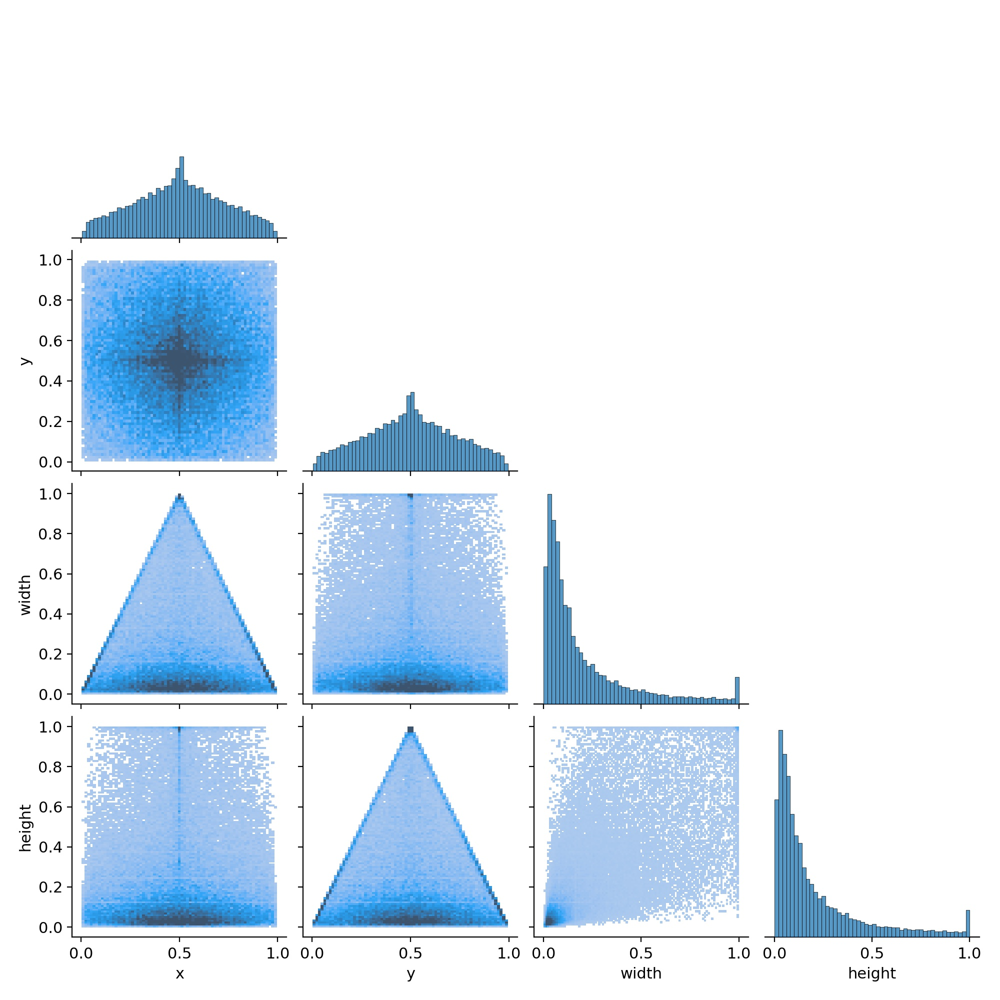

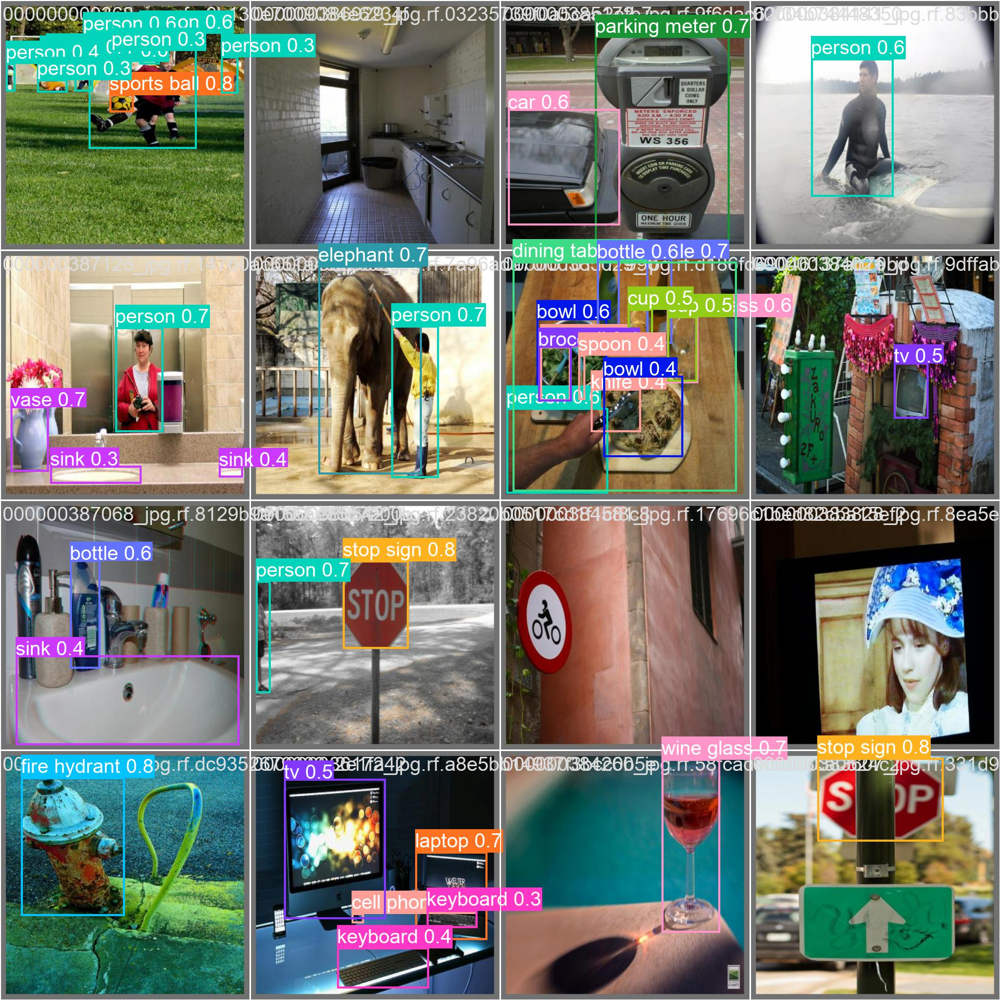

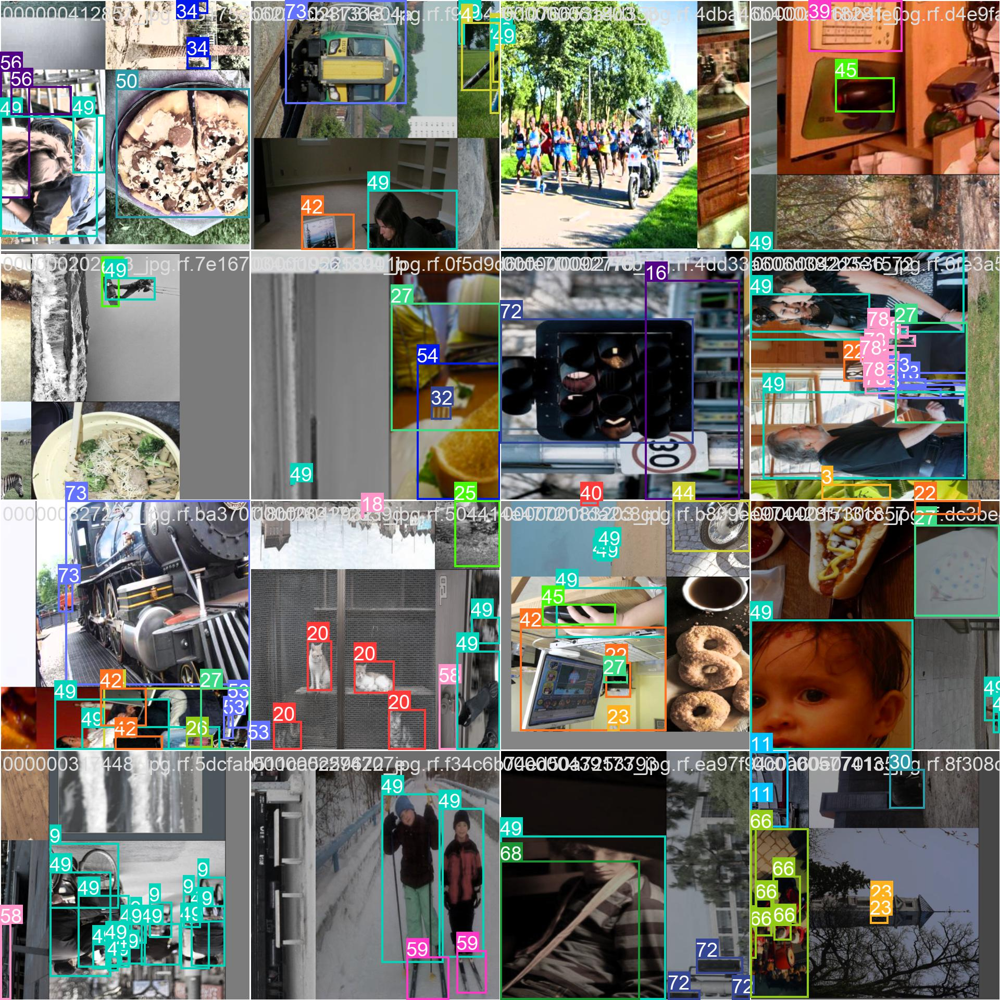

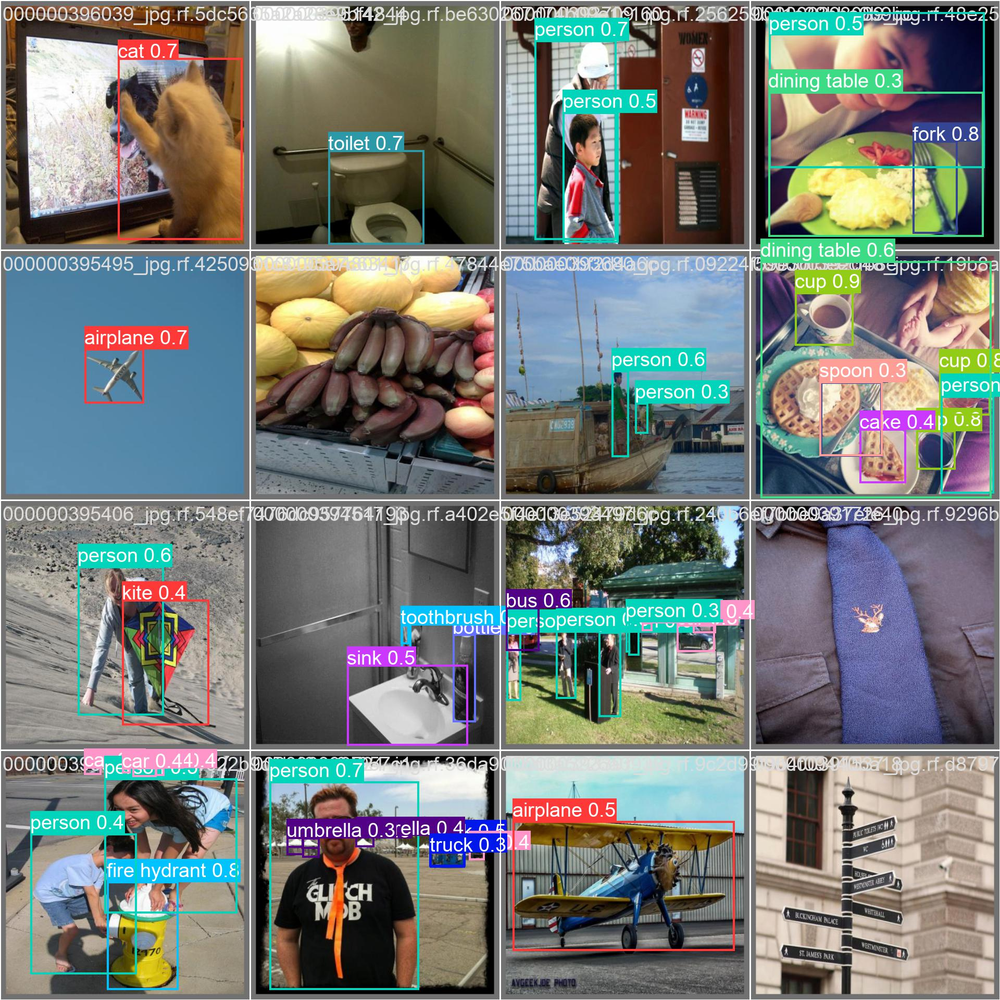

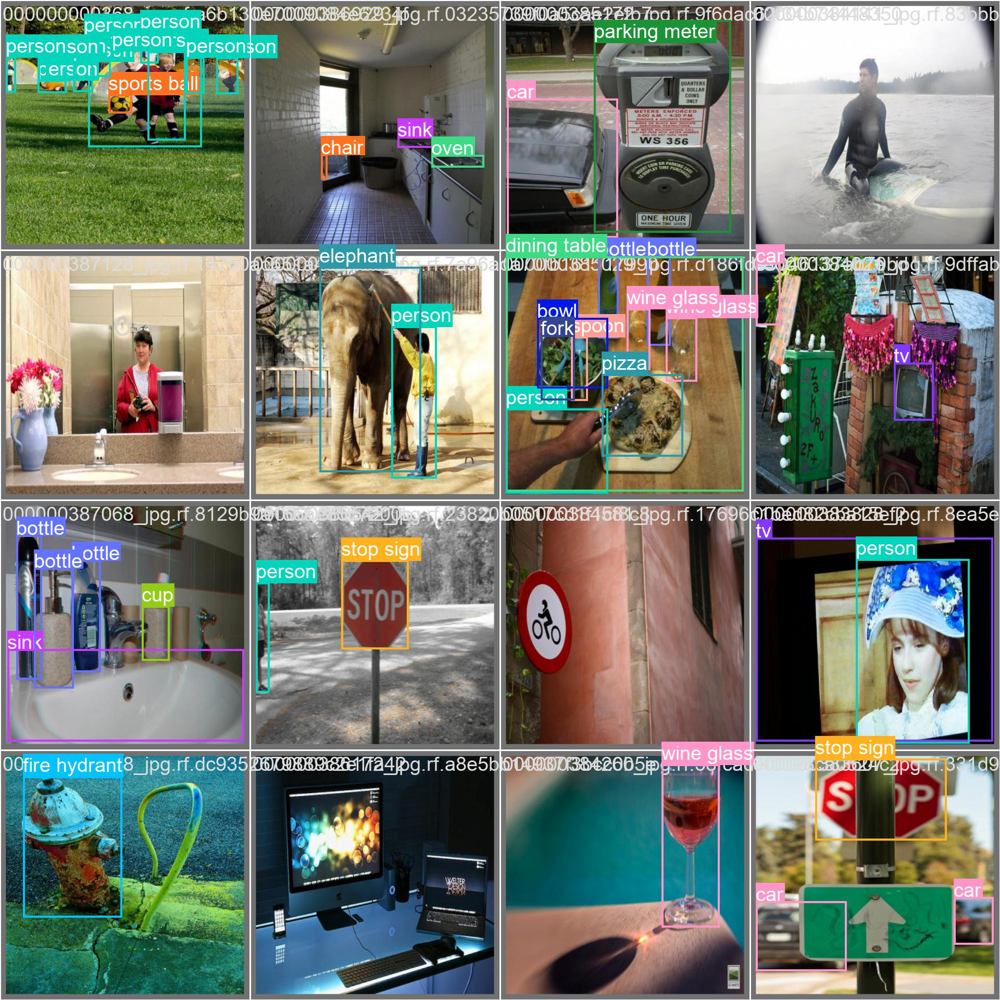

...

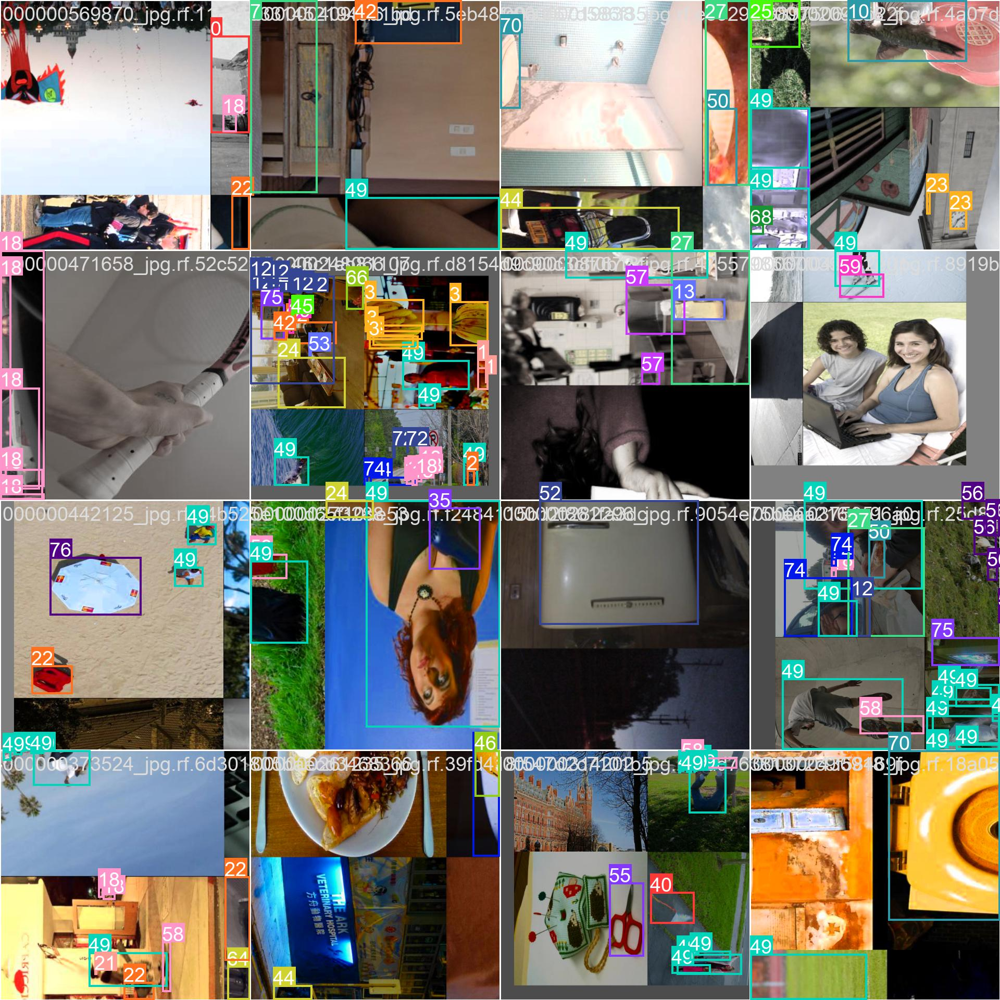

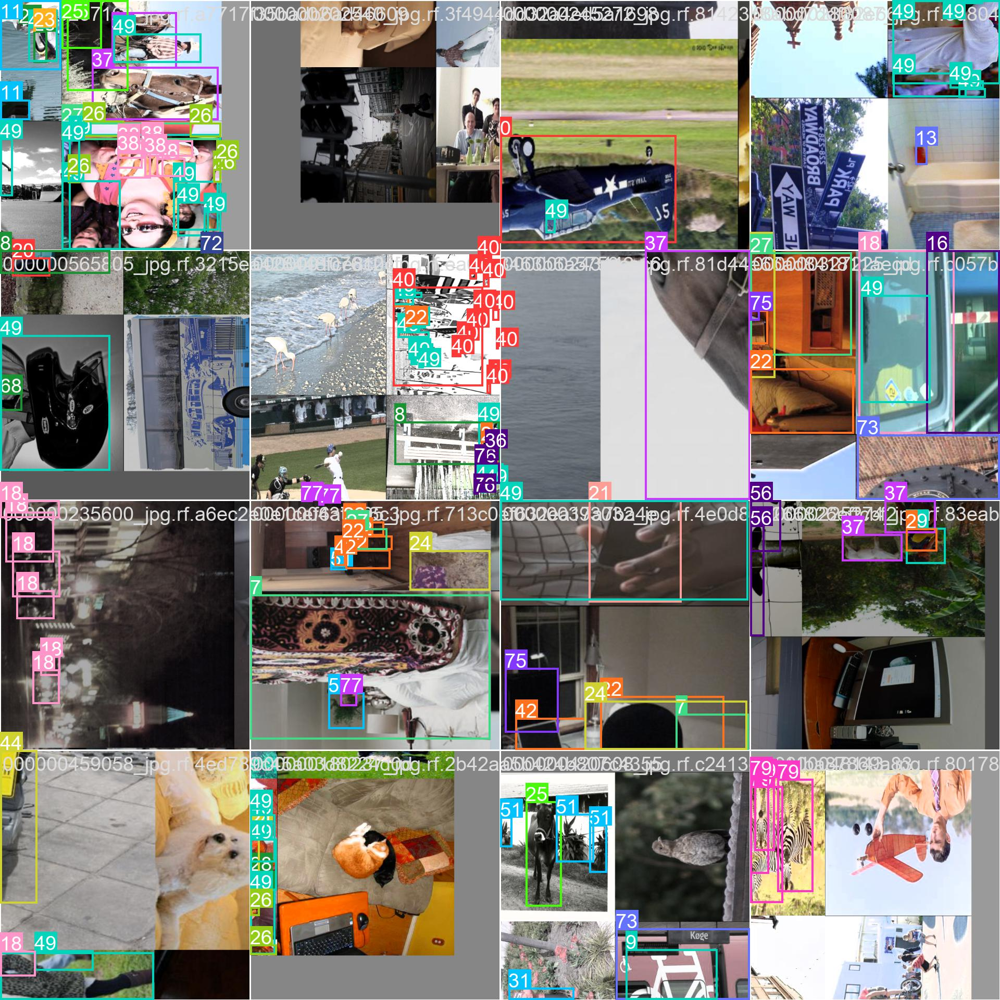

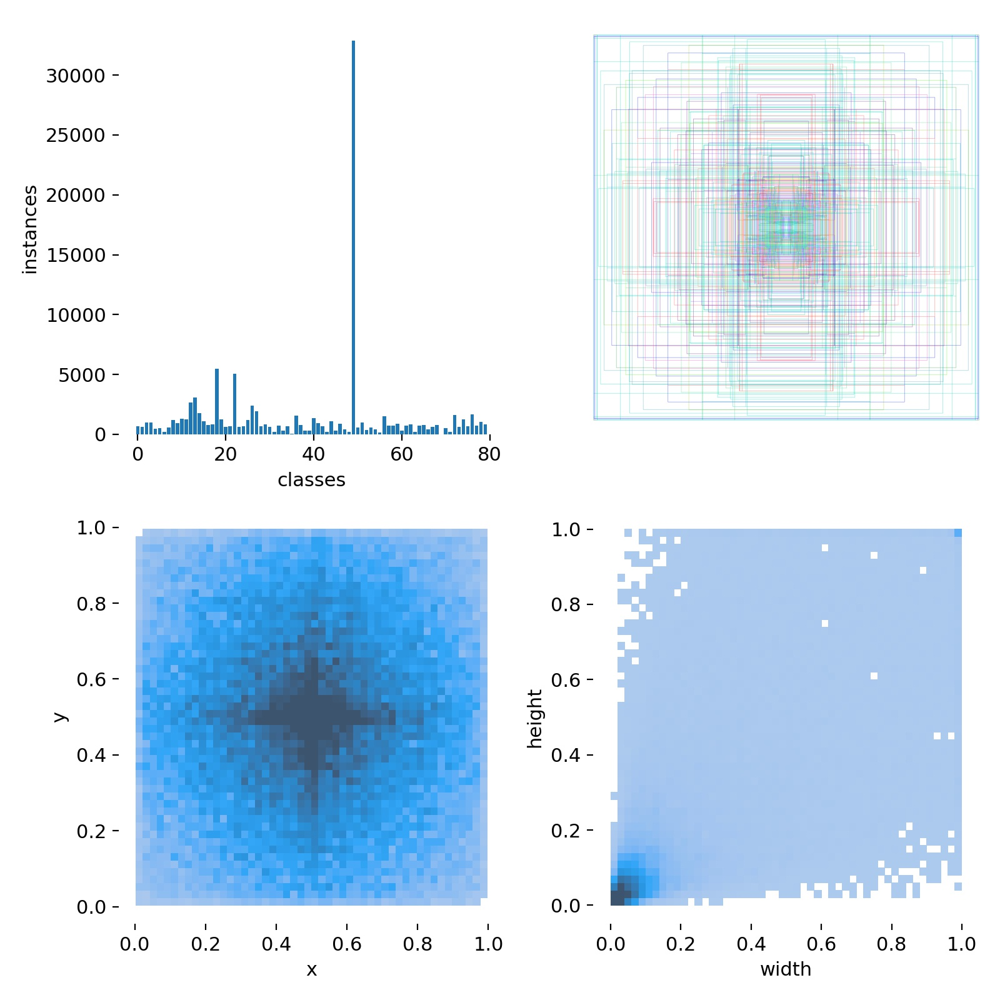

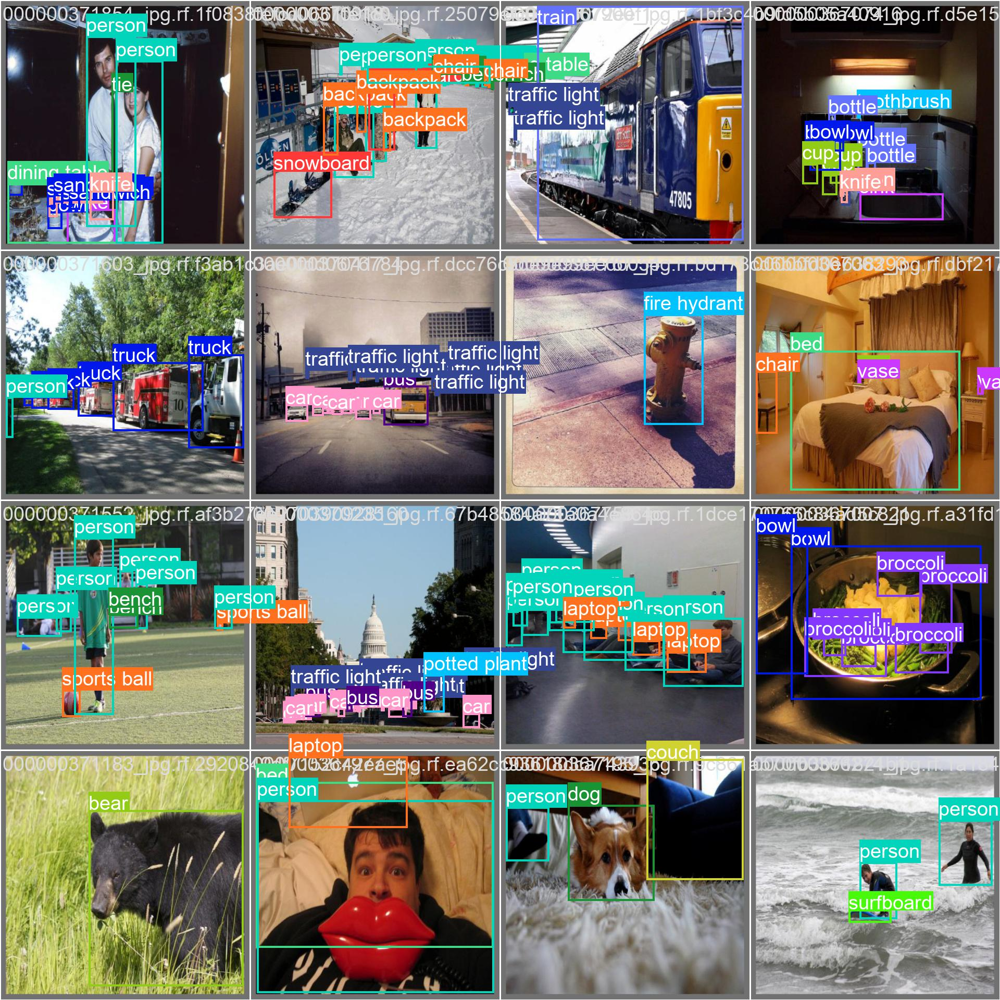

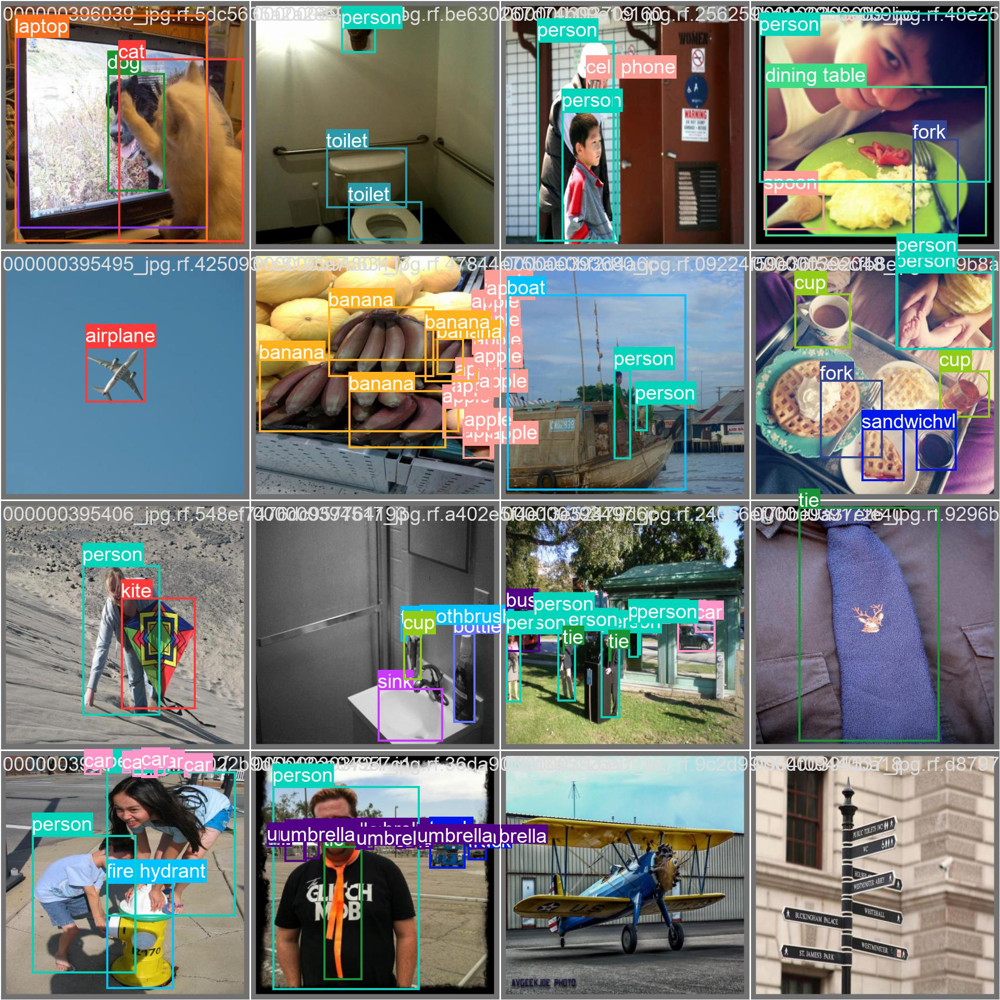

In [7]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/train/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## Detect images

In [11]:
!python3 detect.py --data /content/yolov5/data/data.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/data/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/data/images, data=/content/yolov5/data/data.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-188-g209be93 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 1 bicycle, 1 bus, 3 persons, 73.9ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 1 tie, 32.8ms
Speed: 0.4ms pre-process, 53.3ms inference, 1.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


## See the Results of detected images

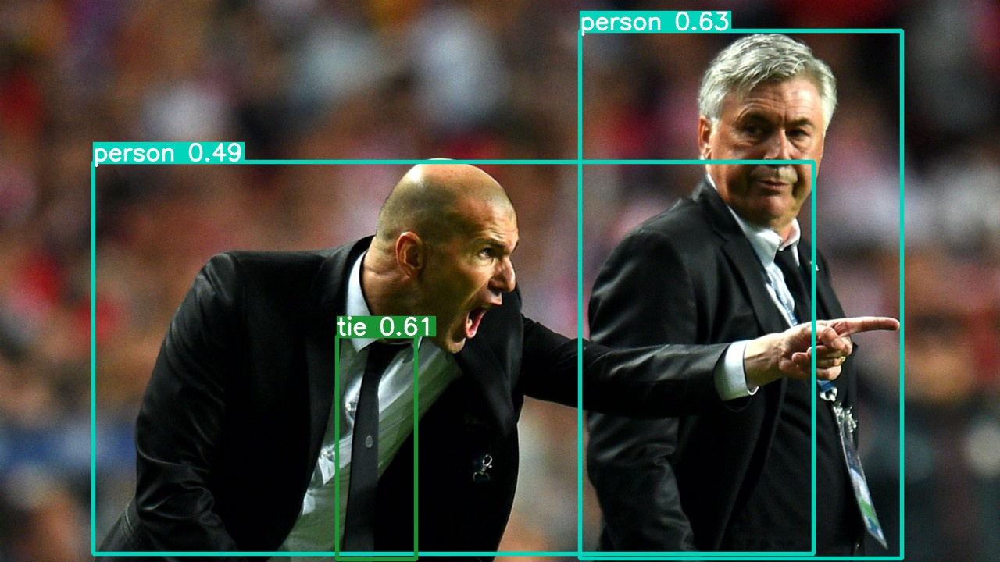

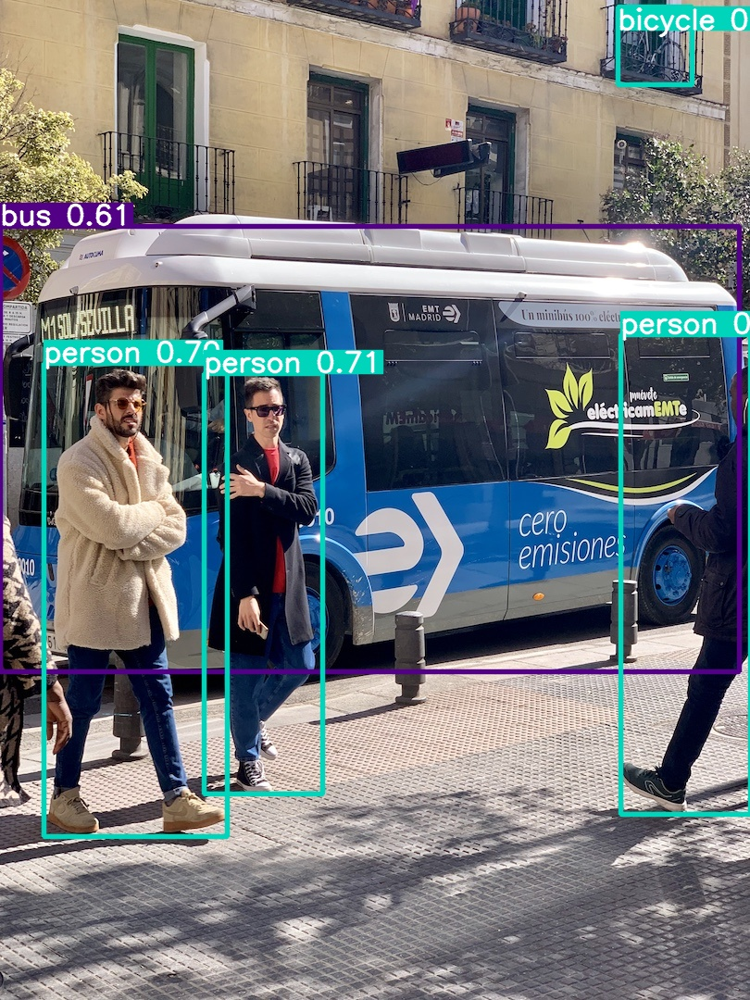

In [14]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# ## Detect a video

In [17]:
!python3 detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/video.mp4

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/video.mp4, data=/content/yolov5/data/data.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-188-g209be93 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
video 1/1 (1/3133) /content/yolov5/video.mp4: 384x640 2 cars, 47.2ms
video 1/1 (2/3133) /content/yolov5/video.mp4: 384x640 3 cars, 41.8ms
video 1/1 (3/3133) /content/yolov5/video.mp4: 384x640 3 cars, 41.9ms
video 1/1 (4/3133) /content/yolov5/video.mp4: 384x640 4 cars, 41.4ms
video 1/1 (5/3133) /content/yolo

## Detect a real time object

> Indented block



In [18]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import io 
import time
import cv2
from threading import Timer


def take_photo(filename='web_photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);
      
    

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolveee) => capture.onclick = resolveee);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
    
  # display(js)
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to web_photo.jpg


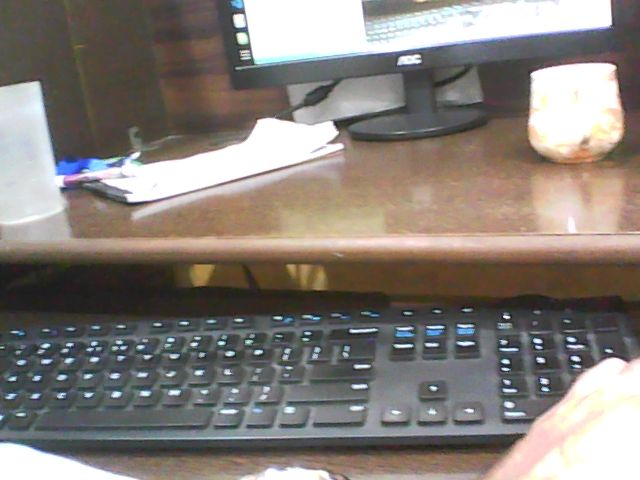

In [19]:
import PIL.Image
import cv2
try:
  filename = take_photo()
  picture = PIL.Image.open(filename)  
  picture = picture.save("/content/yolov5/data/images/web_photo.jpg") 
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [21]:
!python3 detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/data/images/web_photo.jpg

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/data/images/web_photo.jpg, data=/content/yolov5/data/data.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-188-g209be93 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
image 1/1 /content/yolov5/data/images/web_photo.jpg: 480x640 1 keyboard, 73.2ms
Speed: 0.5ms pre-process, 73.2ms inference, 1.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp9


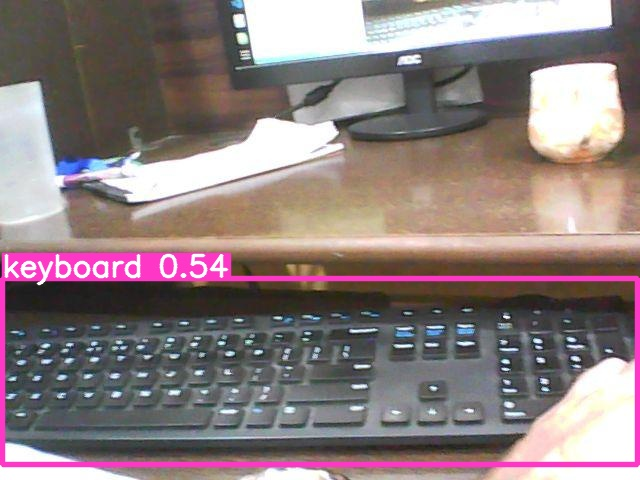

In [22]:
for imageName in glob.glob('//content/yolov5/runs/detect/exp9/web_photo.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")